# <h1><center> Przetwarzanie i analiza danych w języku Python - Projekt II/III </center></h1>

# <h1><center>Raport z pobranych zbiorów benchmarkowych</center></h1>


## Wstęp

W poniższym raporcie omówione zostaną wyniki różnych algorytmów analizy skupień zastosowanych na danych benchmarkowych. Dane zostały pobrane ze strony https://github.com/gagolews/clustering_benchmarks_v1.

Większość zbiorów ma 2 lub 3 wymiary. Ułatwia to zwizualizowanie wyników klasteryzacji przez poszczególne metody, jednakże pobrany również zbiór to dużo większych wymiarach.

Zbiory zostały pobrane w postaci plików *.data* oraz *.labels0*. Następnie za pomocą funkcji zdefiniowanych w pliku *Padpy_generowanie_csv.py* wyniki benchmarków zostały zapisane w pliku *.csv*, z którego będziemy korzystać tworząc ten raport.
Za pomocą wyżej wspomnianych funkcji wygenerowane zostały również wykresy jako pliki *.png*, które będą zawarte w poniższym raporcie.

## Wykorzystane metody

Do porównania jakości klasteryzacji wykorzystane zostały następujące metody:
* zaimplementowany zgodnie z instrukcją **algorytm spektralny** (nazwa funkcji: *spectral_clustering*)
* metoda **k_średnich** - z wykorzystaniem pakietu *sklearn* i funkcji *KMeans()*
* algorytmy **hierarchiczne** - z wykorzystaniem funkcji *AgglomerativeClustering* z następującymi parametrami:
    - *single linkage* - miarą odległości między klastrami jest odlegość między najbliższymi punktami z dwóch różnych klastrów
    - *ward linkage* - bazuje na sumie kwadratów odległości euklidesowych między punktami z różnych klastrów
    - *complete linkage* - miarą odległości między klastrami jest odlegość między najdalszymi punktami z dwóch różnych klastrów
    - *average linkage* - średnia odległości każdych obserwacji z dwóch potencjalnych klastrów

* algorytm **DBSCAN** (*Density-Based Spatial Clustering of Applications with Noise*) - klasteryzacja dla najbardziej
zagęszczonych punktów
* algorytm **Genie** - algorytm hierarchiczny bazujący na współczynniku Giniego

Porównanie zostanie również działanie zaimplementowanego algorytmu spektralnego dla różnych parametrów M, równych: 1%, 5%, 10% lub 30% wszystkich obserwacji w danym zbiorze. W przypadku, gdy dla żadnej z tych wartości parametru metoda nie działała dobrze, została również sprawdzona metoda z ręcznie wprowadzoną wartością M, niezależnie od wielkości zbioru.

Jakość wyników poszczególnych algorytmów zostanie porównana za pomocą:
* indeksu **Fowlkesa–Mallowsa** (FMI) - zwraca podobieństwo między zwracanymi klastrami, obliczany za pomocą wzoru:
$$\sqrt{\frac{TP}{TP+FP} \cdot \frac{TP}{TP+FN}}$$

* skorygowanego indeksu **Randa** (ARI) - jest to indeks Randa skorygowany o prawdopodobieństwo przydziału punktów do danego klastra, gdzie indeks Randa jest wyrożony nastepującą furmułą:
$$\sqrt{\frac{TP+TN}{TP+FP+FN+TN}}$$

gdzie: 
- TP - *true positive*
- TN - *true negative*
- FP - *false positive*
- FN - *false negative*

## Pakiety i funkcje 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

import plotly.graph_objects as go

#### Funkcja rysująca wykres słupkowy dla wartości ARI i FMI dla poszczególnych metod:

In [2]:
def wykres1(index_ARI, index_FMI, names, plot_title):
    """
    funkcja przyjmuje argumenty:
    index_ARI - type: list of floats, lista wspolczynnikow ARI
    index_FMI - type: list of floats, lista wspolczynnikow FMI
    names - type: list of strings, lista z nazwami metod uzytych do porownania
    plot_title - type: string, tytul wykresu
    
    funkcja rysuje wykres slupkowy interaktywny za pomoca pakietu Plotly
    """
    fig = go.Figure(data=[
        go.Bar(name='Fowlkes-Mallows index', x=names, y=np.round(index_FMI,4)),
        go.Bar(name='Adjusted Rand index', x=names, y=np.round(index_ARI,4))],
        )
    
    hovertemplate = "<b>%{x}</b><br>" +\
                    "Index value: %{y}<br>"
    
    fig.update_traces(
        hovertemplate=hovertemplate
    )
    fig.update_layout(barmode="group", 
                      title= {
                        'text' : '<b>'+ plot_title +'</b>',
                        'x':0.5,
                        'xanchor': 'center'})
    fig.show()
    
    return

In [3]:
plots_title = "Wykres wartości indeksów FMI i ARI dla poszczególnych algorytmów klasteryzacji"

#### Funkcja generująca tabelę w wartościami indeksów poszczególnych metod:

In [4]:
def tabelka(names, index_ARI, index_FMI, w=1050, h=350):
    """
    Funkcja przyjmuje argumenty:
    index_ARI - type: list of floats, lista wspolczynnikow ARI
    index_FMI - type: list of floats, lista wspolczynnikow FMI
    names - type: list of strings, lista z nazwami metod uzytych do porownania
    """
    fig = go.Figure(data=[go.Table(header=dict(values=['Method', 'Fowlkes-Mallows index',
                                                       'Adjusted Rand index']),
                     cells=dict(values=[names, np.round(index_FMI,4), np.round(index_ARI,4)]))
                         ])
    fig.update_layout(width=w, height=h)
    fig.show()
    return

In [5]:
def tabelka_std(names, index_ARI, index_FMI,index_ARI_std,index_FMI_std, w=1000, h=350):
    """
    Funkcja przyjmuje argumenty:
    index_ARI - type: list of floats, lista wspolczynnikow ARI
    index_FMI - type: list of floats, lista wspolczynnikow FMI
    names - type: list of strings, lista z nazwami metod uzytych do porownania
    index_ARI_std - type: list of floats, lista wspolczynnikow ARI dla zmiennych zestandaryzowanych
    index_FMI_std - type: list of floats, lista wspolczynnikow FMI dla zmiennych zestandaryzowanych
    """
    fig = go.Figure(data=[go.Table(header=dict(values=['Method', 'FMI', 'ARI',
                                                       'FMI for standarized variables', 'ARI for standarized variables']),
                     cells=dict(values=[names, np.round(index_FMI,4), np.round(index_ARI,4), 
                               np.round(index_FMI_std,4), np.round(index_ARI_std,4)]))
                         ])
    fig.update_layout(width=w, height=h)
    fig.show()
    return

Zdefiniujmy ścieżkę do wczytywanych plików oraz funkcję która będzie wczytywała pliki *.csv* i podawała informacje o wymiarach zbioru i liczbie klastrów.

In [6]:
path1 = r"C:\Users\patry\OneDrive\Pulpit\Zdalne pw\Python - PadPy\Projekt_23_dane_benchmarkowe"

def wczytaj(path, file_name):
    zbior = pd.read_csv(path + '\\' + file_name, sep=';')
    print("Wymiary zbioru: ", zbior["Shape"][0])
    print("Liczba klastrów", zbior["Number of clusters"][0])
    return zbior

## Zbiory dwuwymiarowe

### Zbiór *line*

In [7]:
line = wczytaj(path1, 'line_2.csv')

Wymiary zbioru:  (250, 2)
Liczba klastrów 2


Widzimy, że zbiór *line* jest relatywnie niewielki. Odgórnie podzielony jest na dwa klastry, podział wygląda następująco:

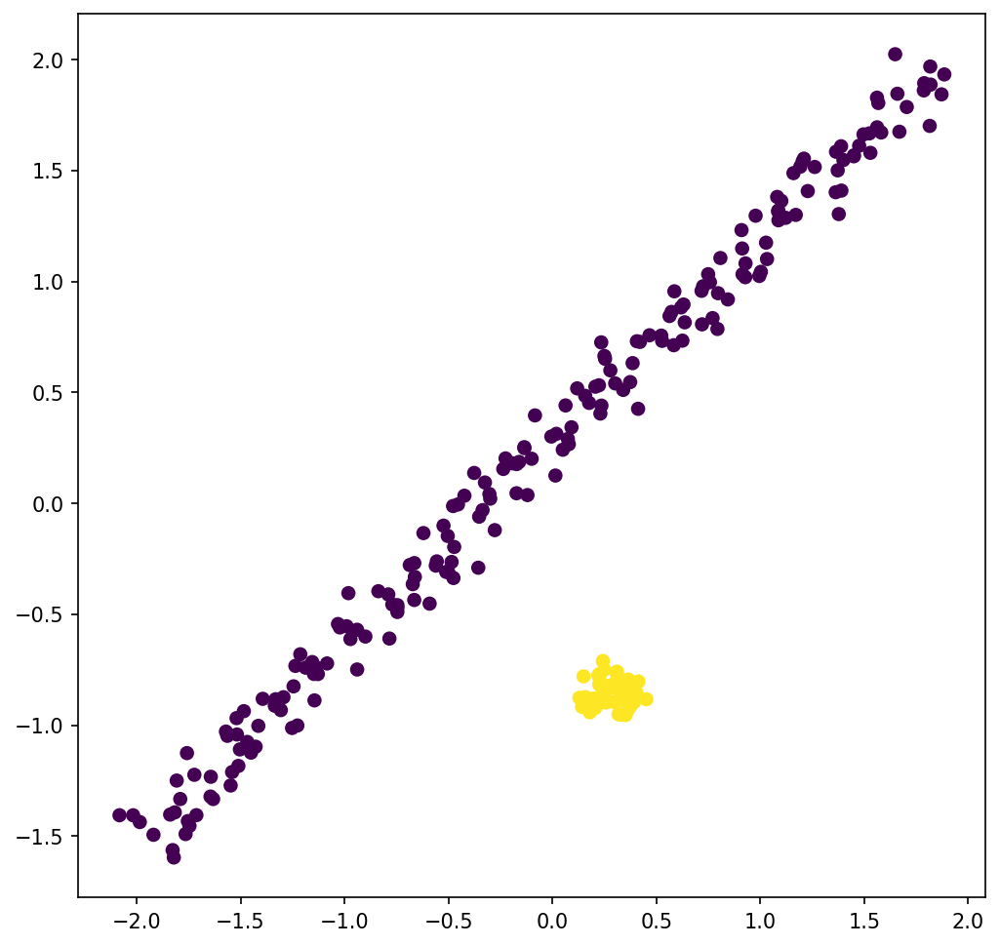

In [8]:
Image(path1 + '\\' + "line_2_main.png", width=500, height=500)

Porównajmy działanie poszczególnych metod klasteryzacji na omawianym zbiorze.

In [9]:
wykres1(list(line['Adjusted Rand index']), list(line['Fowlkes-Mallows index']), list(line['Method']), plots_title)

Na powyższym wykresie widać, że równoważny podział reprezentują metody:
* hierarchiczna z parametrem *single linkage*
* Genie
* DBSCAN
* spektralna z parametrami M równymi 5%, 10% i 30% obserwacji w zbiorze

Pozostałe metody mają ujemne wartości współczynnika *ARI*, zatem działają nieefektywnie. Widać to też na poniższych wykresach reprezentujących zbior podzielony na klastry przez poszczególne algorytmy.

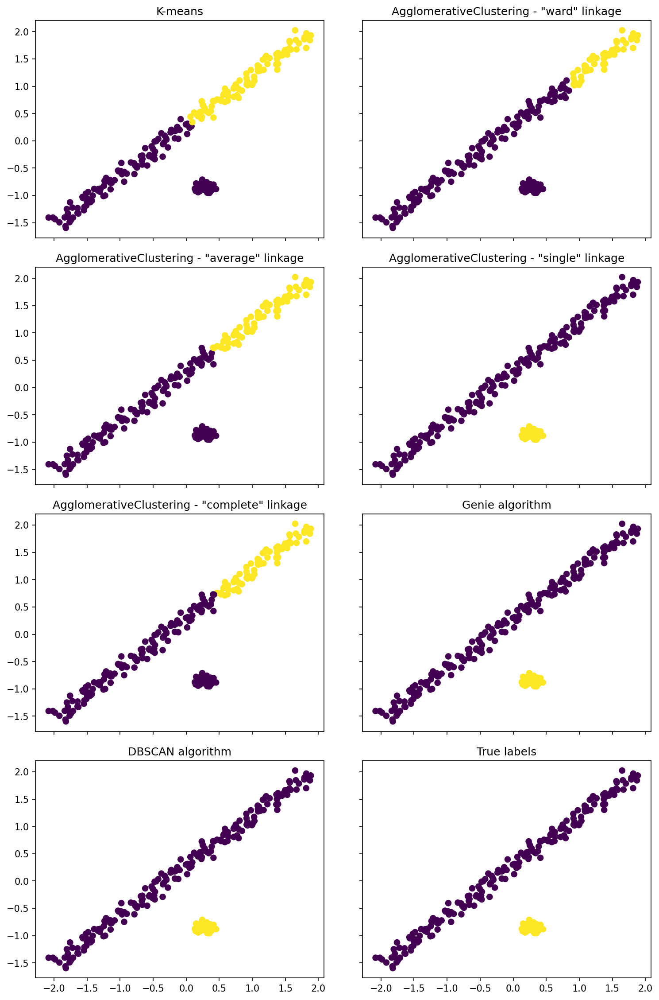

In [10]:
Image(path1 + '\\' + 'line_2_builtin_methods.png', width=1000, height=500)

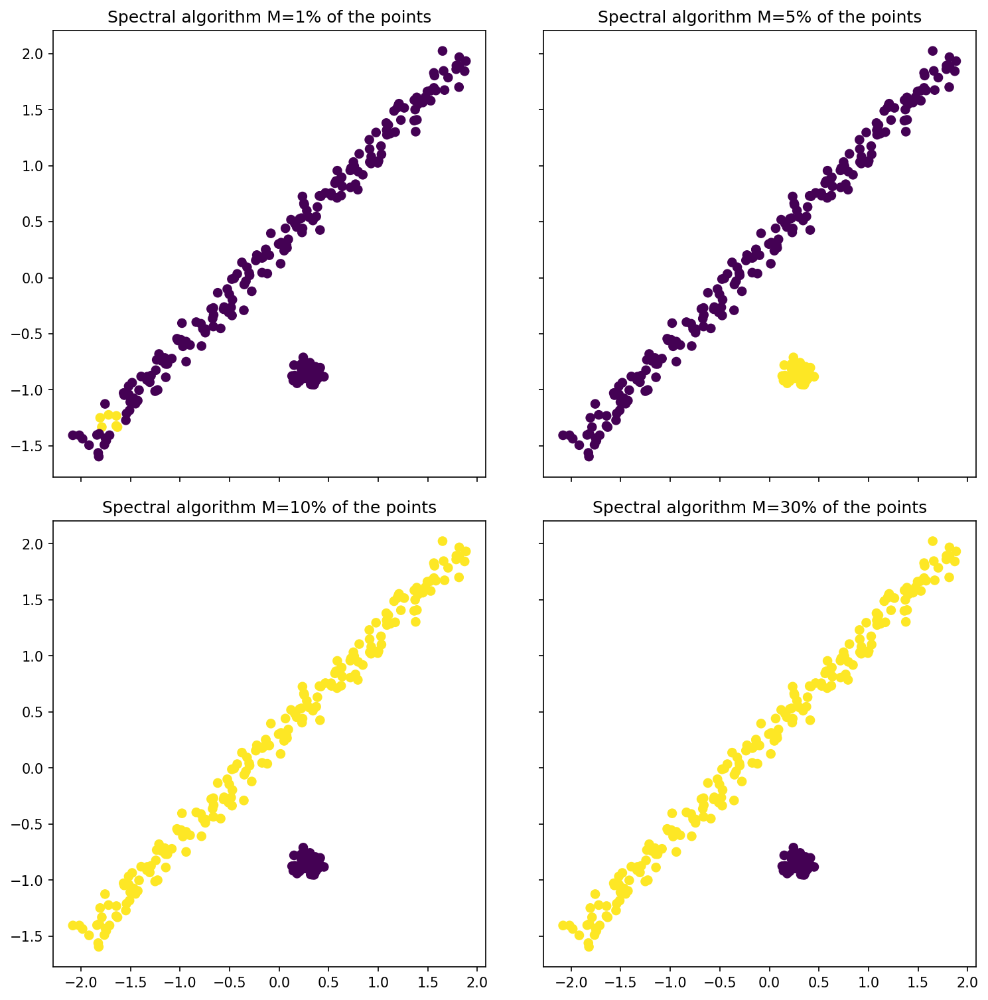

In [11]:
Image(path1 + '\\' + "line_2_spectral_algorithm.png", width=1000, height=500)

### Standaryzacja zmiennych

Zbadamy wpływ standaryzacji zmiennych na działanie algorytmów.

In [12]:
line_std = wczytaj(path1, 'line_std_2.csv')

Wymiary zbioru:  (250, 2)
Liczba klastrów 2


In [13]:
tabelka_std(list(line['Method']), list(line['Adjusted Rand index']), list(line['Fowlkes-Mallows index']),
            list(line_std['Adjusted Rand index']),list(line_std['Fowlkes-Mallows index']), w=1000, h=650)

Widzimy, że standaryzacja nie ma żadnego wpływu na wartości indeksów (możliwe, że pobrane zbiory były już zestandaryzowane).

### Zbiór *parabolic*

Zbiór *parabolic* ma 2 pliki z etykietami (*labels0*, *labels1*), które dzielą zbiór odpowiednio na 2 i 4 klastry. Wczytajmy najpierw wyniki benchmarków dla piewszej z etykiet.

In [14]:
parabolic = wczytaj(path1, 'parabolic_2.csv')

Wymiary zbioru:  (1000, 2)
Liczba klastrów 2


In [15]:
parabolic2 = wczytaj(path1, 'parabolic_4.csv')

Wymiary zbioru:  (1000, 2)
Liczba klastrów 4


Widzimy, że zbiór jest większy od poprzedniego, ma on 1000 obserwacji. Zobaczmy na wykresie jego odgórny podział na 2 i 4 części.

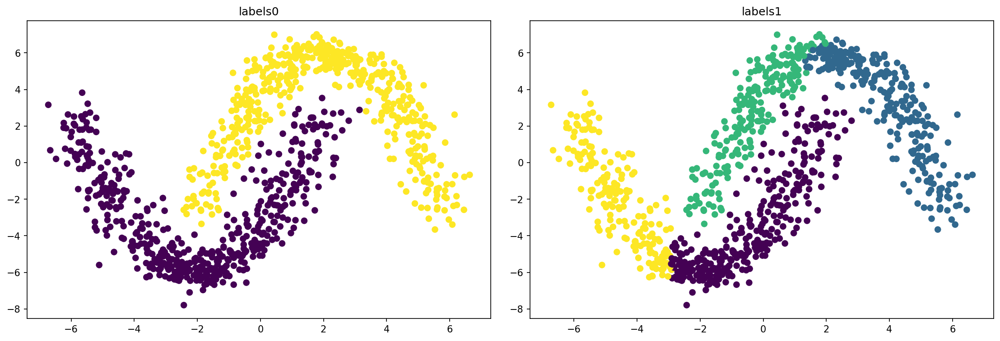

In [16]:
Image(path1 + '\\' + "parabolic_two_labels.png", width=1000, height=500)

Widzimy, że klastry przypominają 'kawałki' paraboli. Porównajmy najpierw jakość podziału na 2 części zwrócony przez poszczególne metody z podziałem narzuconym z etykiet.

In [17]:
wykres1(list(parabolic['Adjusted Rand index']), list(parabolic['Fowlkes-Mallows index']), list(parabolic['Method']), plots_title)

W tym przypadku żaden z algorytmów nie zwrócił równoważnego podziału z podziałem odgórnym. Największe współczynniki *ARI* i *FMI* mają metody *Genie* oraz *DBSCAN*. Zobaczmy jak to wygląda na wykresach.

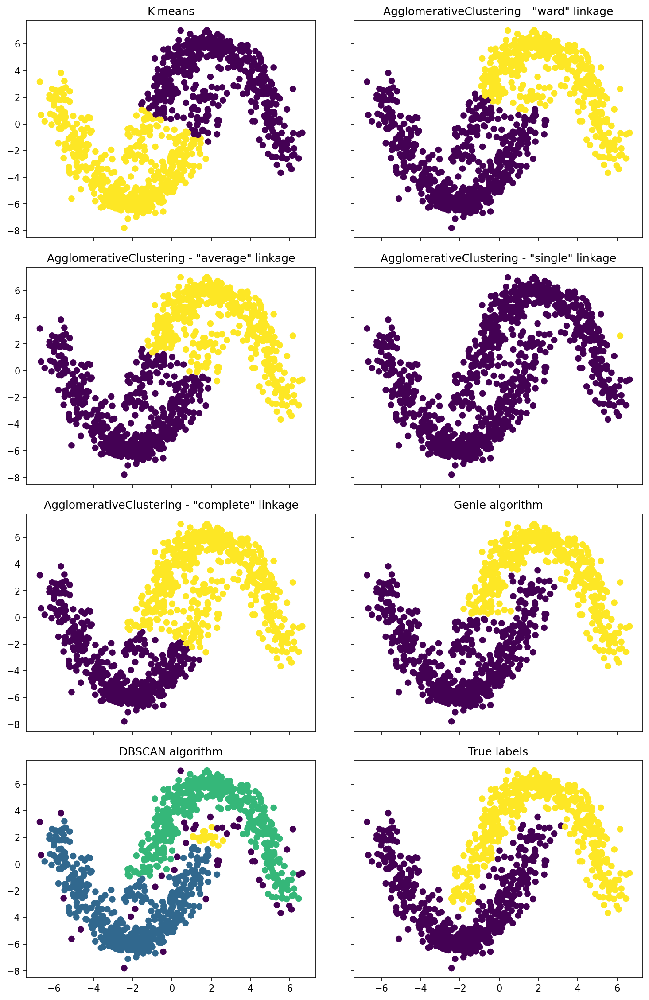

In [18]:
Image(path1 + '\\' + 'parabolic_2_builtin_methods.png', width=1000, height=500)

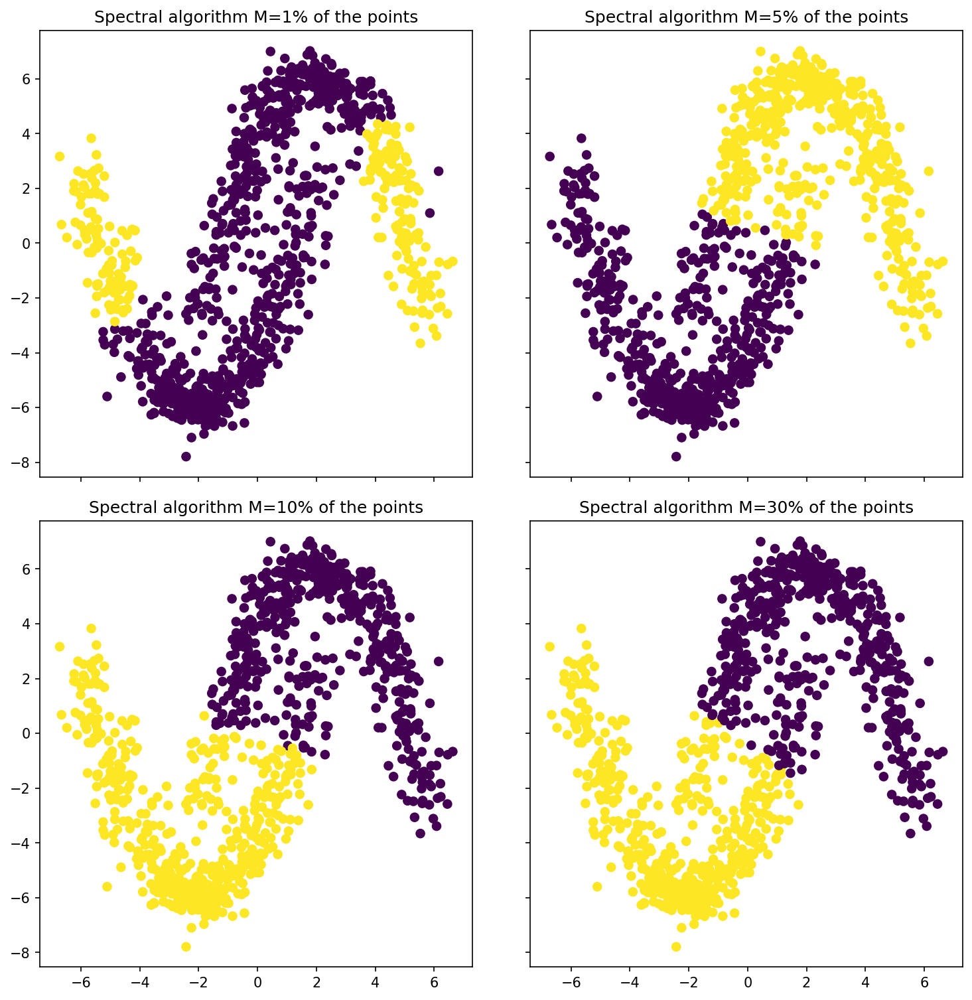

In [19]:
Image(path1 + '\\' + 'parabolic_2_spectral_algorithm.png', width=1000, height=500)

Obserwując wykresy warto zauważyć, że algorytm *DBSCAN* samodzielnie znajduję liczbę klastrów i w tym przypadku utworzył klaster koloru fioletowego reprezentujący szum (co jest ogólną zaletą tego algorytmu).

### Standaryzacja zmiennych

Zbadamy różnicę w klasteryzacji dla poszczególnych metod w przypadku, gdy zmienne są zestandaryzowane.

In [20]:
parabolic_std = wczytaj(path1, 'parabolic_std_2.csv')

Wymiary zbioru:  (1000, 2)
Liczba klastrów 2


In [21]:
tabelka_std(list(parabolic['Method']), list(parabolic['Adjusted Rand index']), list(parabolic['Fowlkes-Mallows index']),
            list(parabolic_std['Adjusted Rand index']),list(parabolic_std['Fowlkes-Mallows index']), w=1000, h=650)

W tym przypadku możemy zauważyc znaczny spadek wartości skorygowanego indeksu Randa dla algorytmu spektralnego oraz dla metody *DBSCAN*. Na pozostałe metody standaryzacja nie miała większego wpływu.

### Zbiór *parabolic* - dla czterech klastrów

Analogicznie porównajmy indeksy ARI oraz FMI, a także zwizualizujmy podział zbiorór przez analizowane metody.

In [22]:
wykres1(list(parabolic2['Adjusted Rand index']), list(parabolic2['Fowlkes-Mallows index']), list(parabolic2['Method']), plots_title)

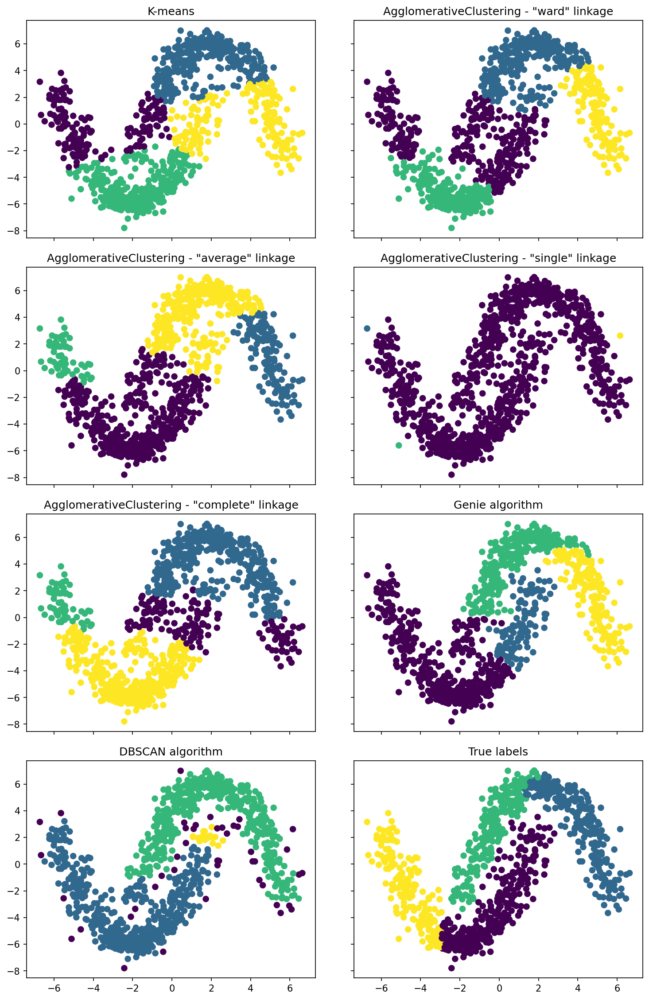

In [23]:
Image(path1 + '\\' + 'parabolic_4_builtin_methods.png', width=1000, height=500)

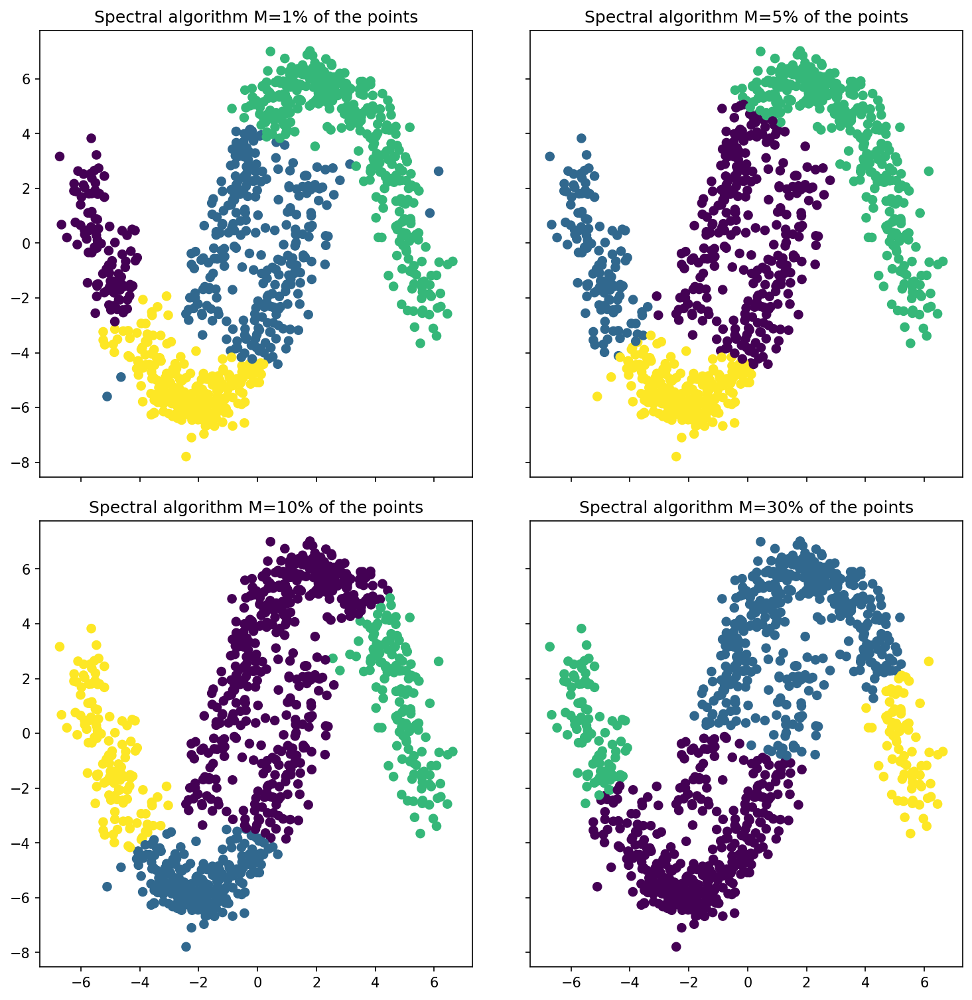

In [24]:
Image(path1 + '\\' + 'parabolic_4_spectral_algorithm.png', width=1000, height=500)

Wartości współczynników, że najbliżej oryginalnego podziału są zbiory wynikowe *algorytmu spektralnego*, jednakże analizując wykresy można mieć zdecydowanie inne wrażenie. Wizualnie odgórny podział najbardziej przypominają klastry algorytmu *Genie*.

Mimo wszystko w tym przypadku żaden algorytm nie działa zbyt dobrze.

### Zbiór *spiral*

In [25]:
spiral = wczytaj(path1, 'spiral_3.csv')

Wymiary zbioru:  (312, 2)
Liczba klastrów 3


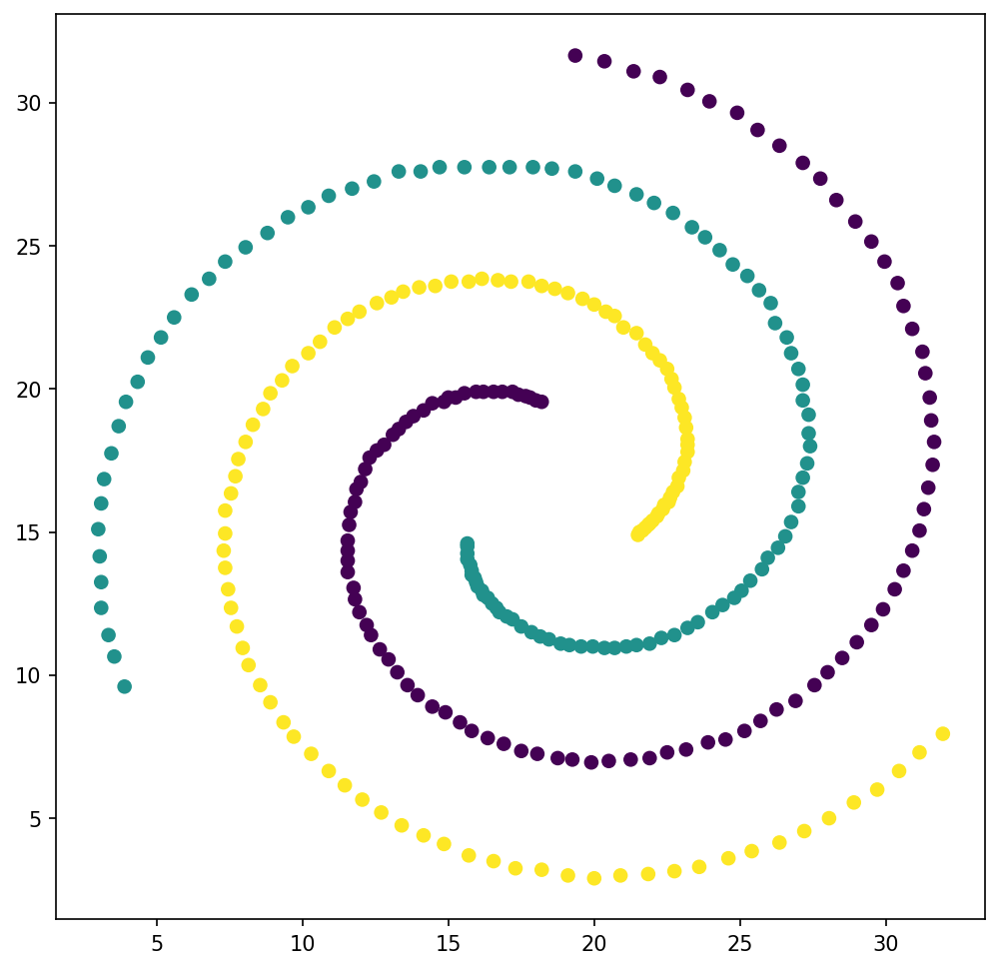

In [26]:
Image(path1 + '\\' + "spiral_3_main.png", width=500, height=500)

Sprawdźmy jakość podziału zbioru *spiral* na trzy klastry.

In [27]:
tabelka(list(spiral['Method']), list(spiral['Adjusted Rand index']), list(spiral['Fowlkes-Mallows index']), h=500)

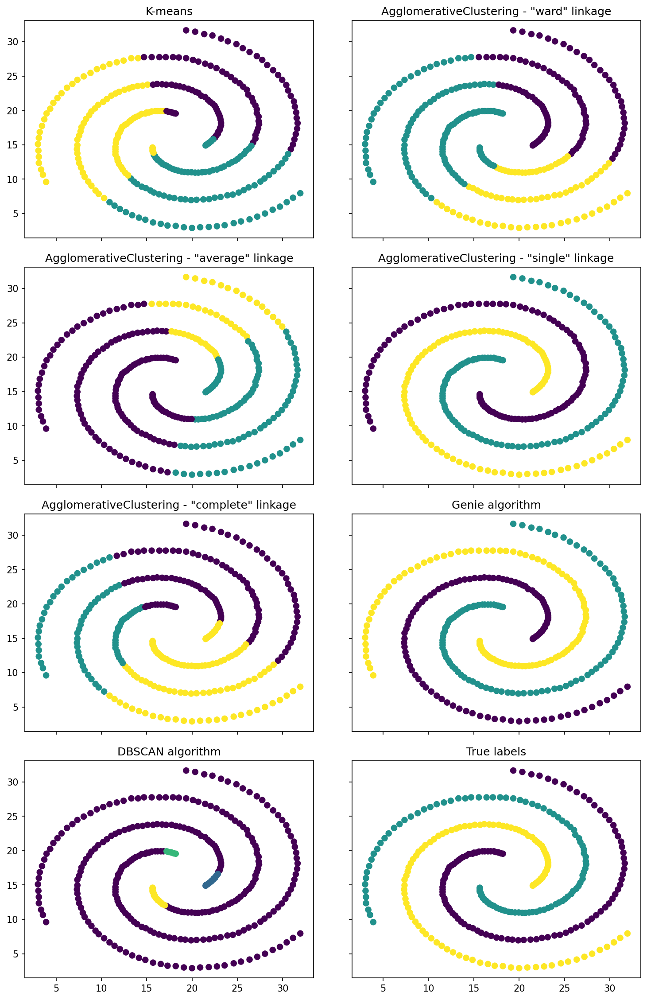

In [28]:
Image(path1 + '\\' + 'spiral_3_builtin_methods.png', width=1000, height=500)

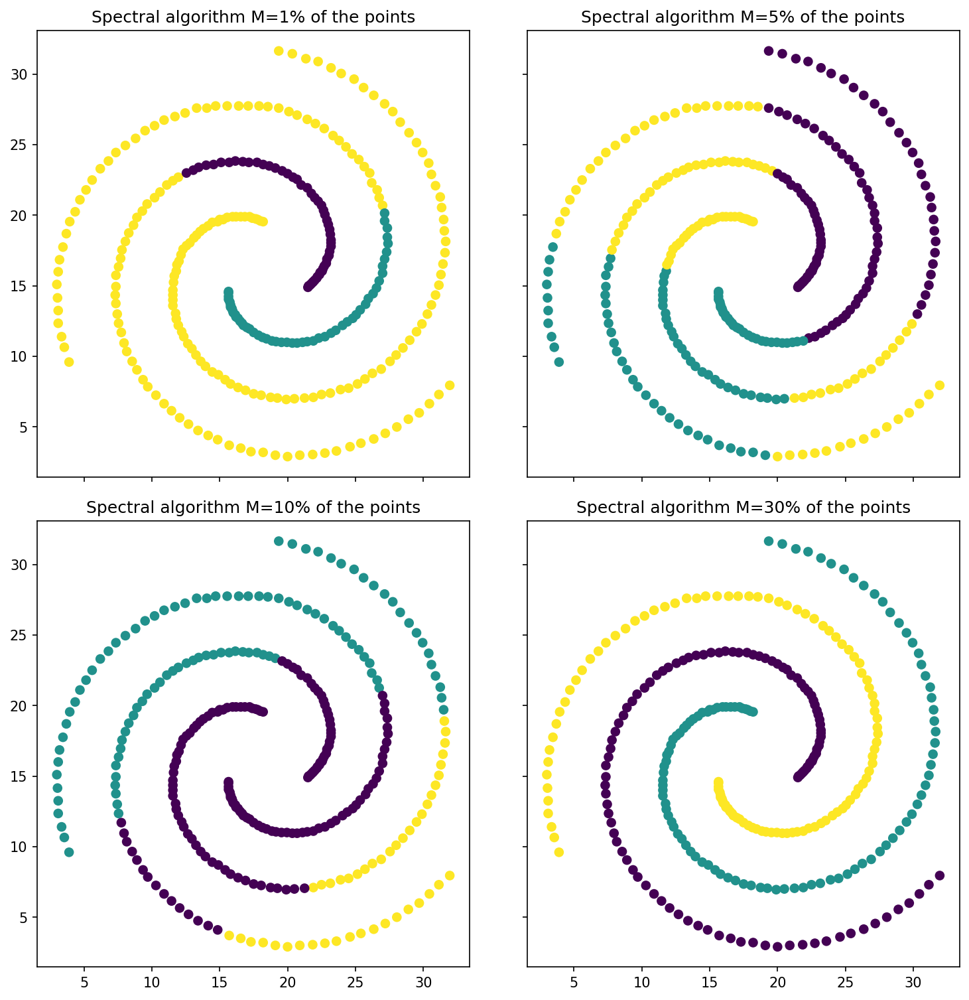

In [29]:
Image(path1 + '\\' + 'spiral_3_spectral_algorithm.png', width=1000, height=500)

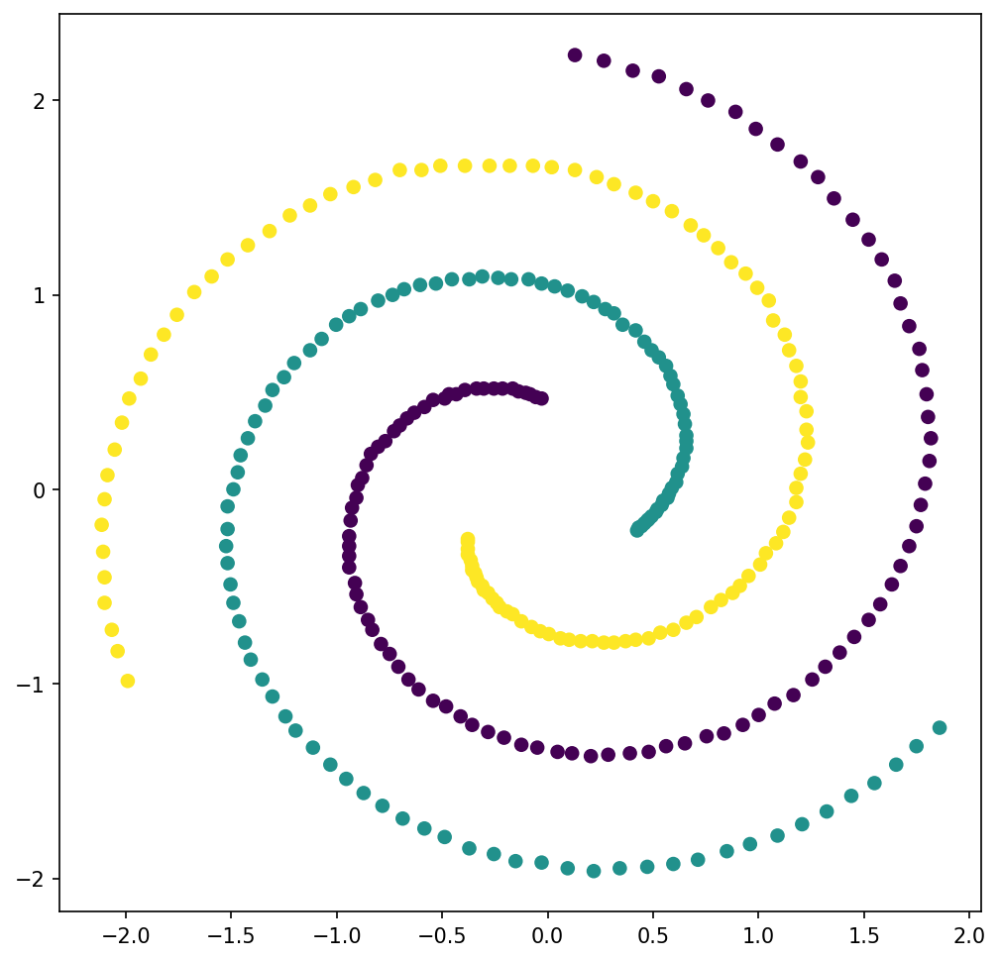

In [30]:
Image(path1 + '\\' + "spiral_spectral_10__3_main.png", width=500, height=500)

Na podstawie wartości współczynników z tabeli oraz wizualizacji widzimy, że najlepszy podział zbioru zwracają:
* metoda hierarchiczna z parametrem *single linkage*
* algorytm *Genie*
* algorytm spektralny z ręcznie ustawionym parametrem M=10

### Standaryzacja zmiennych

In [31]:
spiral_std = wczytaj(path1, 'spiral_std_3.csv')

Wymiary zbioru:  (312, 2)
Liczba klastrów 3


In [32]:
tabelka_std(list(spiral['Method']), list(spiral['Adjusted Rand index']), list(spiral['Fowlkes-Mallows index']),
            list(spiral_std['Adjusted Rand index']),list(spiral_std['Fowlkes-Mallows index']),w=1000, h=750)

W tym przypadku po standaryzacji zmiennych, możemy zauważyć znaczną poprawę działania metody *DBSCAN*, której podział stał się równoważny do podziału oryginalnego. Może to zaskakiwać biorąc pod uwagę, że w kilku poprzednich zbiorach algorytm ten po standaryzacji działał zdecydowanie gorzej. 

Jednak w tym przypadku po standaryzacji po standaryzacji punkty w jednym klastrze są jeszcze gęściej położone, co mogło zaważyć na poprawie jakości algorytmu, który właśnie bazuje na gęstości położonych punktów.

### Zbiór *engytime*

In [33]:
engytime0 = wczytaj(path1, 'engytime2_v0.csv')

Wymiary zbioru:  (4096, 2)
Liczba klastrów 2


In [34]:
engytime1 = wczytaj(path1, 'engytime2_v1.csv')

Wymiary zbioru:  (4096, 2)
Liczba klastrów 2


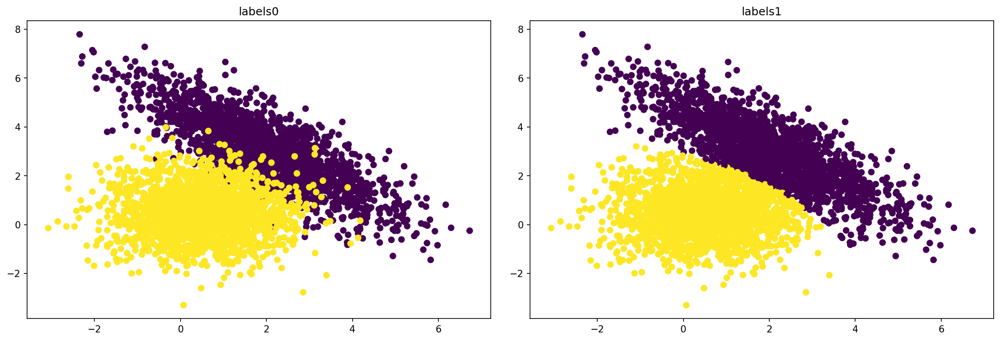

In [35]:
Image(path1 + '\\' + "engytime_two_labels.png", width=1000, height=500)

Widzimy, że zbiór *engytime* oryginalnie został podzielony na dwa klastry, ale na dwa różne sposoby. Podział na wykresie po prawej stronie jest jednak bardziej intuicyjny i to nim się zajmiemy.

In [36]:
wykres1(list(engytime1['Adjusted Rand index']), list(engytime1['Fowlkes-Mallows index']), list(engytime1['Method']), plots_title)

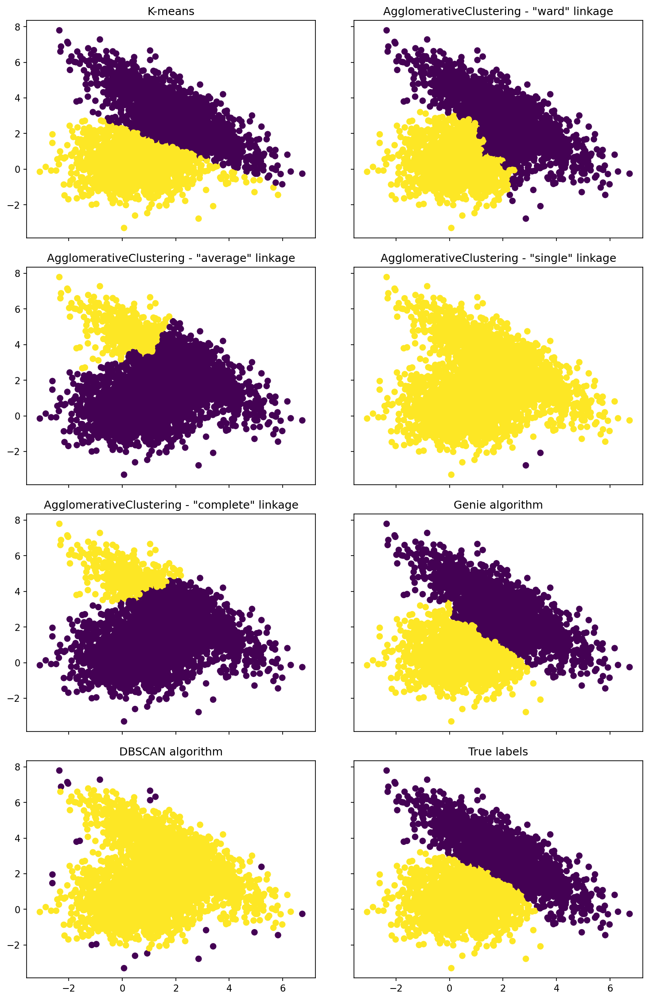

In [37]:
Image(path1 + '\\' + 'engytime_2_builtin_methods.png', width=1000, height=500)

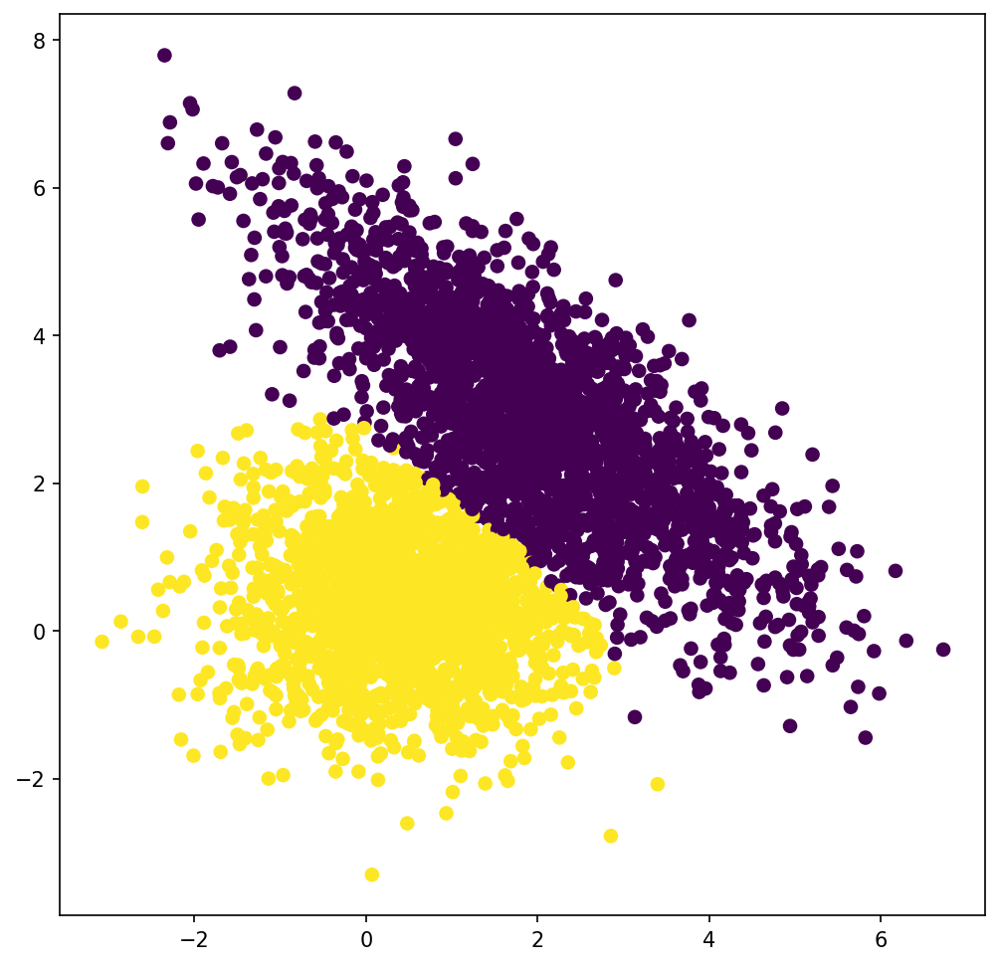

In [38]:
Image(path1 + '\\' + "engytime_spectral_1%__2_main.png", width=500, height=500)

Widzimy, że w tym przypadku zbiór został dosyć dobrze podzielony metodą *spektralną* oraz *Genie*. W odróżnieniu od poprzednich zbiorów, w tym przypadku dobre podziały zwróciły: algorytm *k-srednich* oraz algorytm *hierarchiczny* bazujący na przeciętnej odległości. Jednakże patrząc na kształ zbioru, wyniki nie powinny dziwić, ponieważ wszystkie punkty są położone gęsto, zatem lepiej zadziałają metody oparte na średnich odległościach.

Ciekawy, niemniej jednak logiczny rozumiejąc jego działanie, jest również podział oparty na algorytmie *DBSCAN*, który oddzielił punkty będące **szumem** od jednego głównego klastra stanowiącego większość obserwacji w zbiorze.

### Zbiór *zigzag_noisy*

In [39]:
zigzag4 = wczytaj(path1, 'zigzag_noisy_4.csv')

Wymiary zbioru:  (300, 2)
Liczba klastrów 4


In [40]:
zigzag6 = wczytaj(path1, 'zigzag_noisy_6.csv')

Wymiary zbioru:  (300, 2)
Liczba klastrów 6


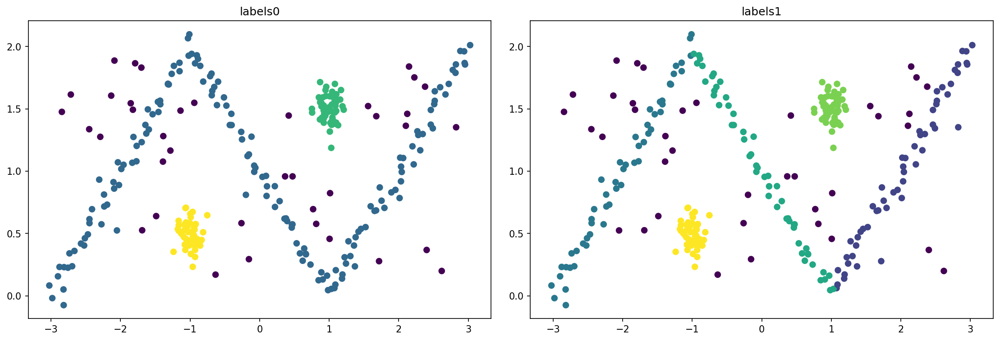

In [41]:
Image(path1 + '\\' + "zigzag_noisy_two_labels.png", width=1000, height=500)

Widzimy, że według etykiet z plikków *.labels* zbiór jest podzielony na 4 lub na 6 klastrów. Zauważmy, że w każdym podziale, jeden z klastrów stanowi **szum**. Sprawdzimy więc, jak dobrze poszczególne metody go wykrywają. Bardziej intuicyjny jest podział na 4 klastry, więc ten omówimy.

In [42]:
tabelka(names = list(zigzag4['Method']), index_ARI = list(zigzag4['Adjusted Rand index']), 
        index_FMI = list(zigzag4['Fowlkes-Mallows index']), w=1050, h=500)

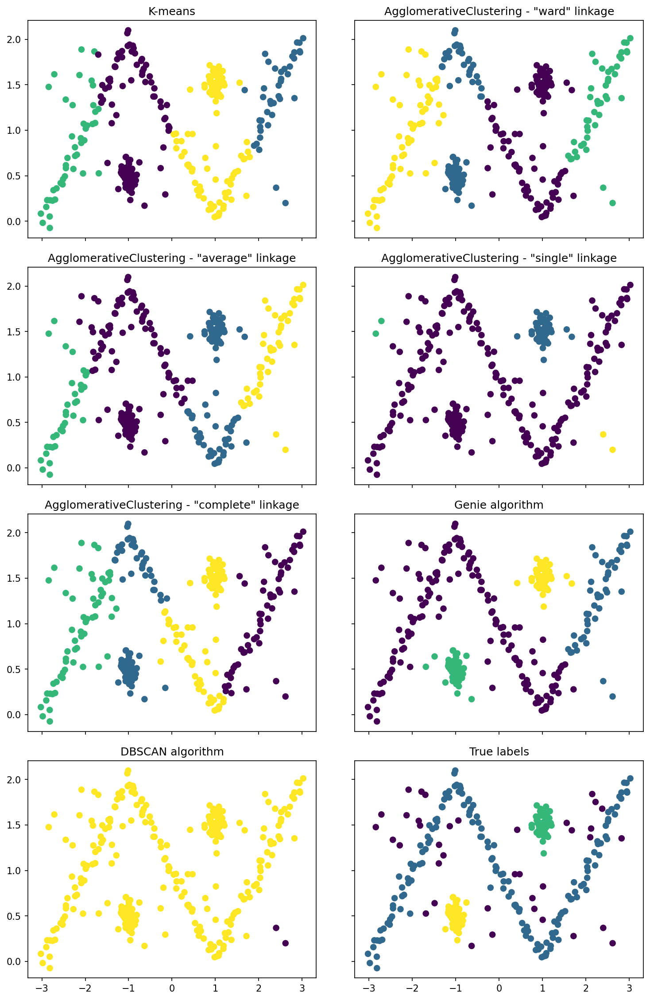

In [43]:
Image(path1 + '\\' + 'zigzag_noisy_4_builtin_methods.png', width=1000, height=500)

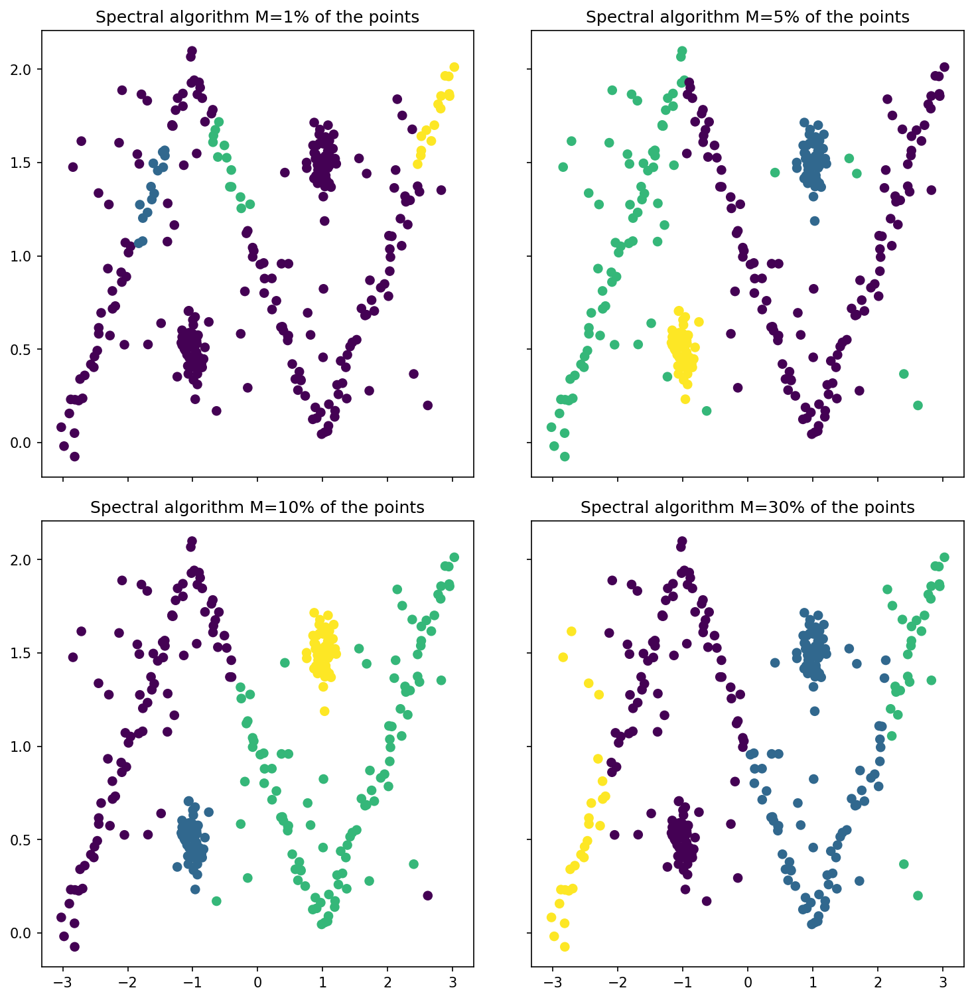

In [44]:
Image(path1 + '\\' + 'zigzag_noisy_4_spectral_algorithm.png', width=1000, height=500)

Niestety w tym przypadku żaden algorytm nie działa efektywnie. Najwyższe współczynniki *ARI* oraz *FMI* mają metody *Genie* oraz *spektralna* dla M=5% obserwacji. Jednakże nawet te podziały nie wykrywają szumu, a pozostałe klastry również są dalekie od oryginalnych.

## Standaryzacja zmiennych

In [45]:
zigzag4_std = wczytaj(path1, 'zigzag_noisy_std_4.csv')

Wymiary zbioru:  (300, 2)
Liczba klastrów 4


In [46]:
tabelka_std(list(zigzag4['Method']), list(zigzag4['Adjusted Rand index']), list(zigzag4['Fowlkes-Mallows index']),
            list(zigzag4_std['Adjusted Rand index']),list(zigzag4_std['Fowlkes-Mallows index']), w=1000, h=650)

W tym przypadku standaryzacja zmiennych niewiele poprawiła w żadnym z podziałów. Może to być spowodowane tym, że przedziały wartości obu współrzędnych są symetryczne i ich krańce nie są duże (-2,2). Jak wiemy standaryzacja jest szczególnie ważna w przypadku zmiennych różniących się rzędem wielkości albo chociaż kilkukrotnie, co nie zdarza się w tym zbiorze.

# Zbiór *square*

In [47]:
square = wczytaj(path1, 'square_2.csv')

Wymiary zbioru:  (1000, 2)
Liczba klastrów 2


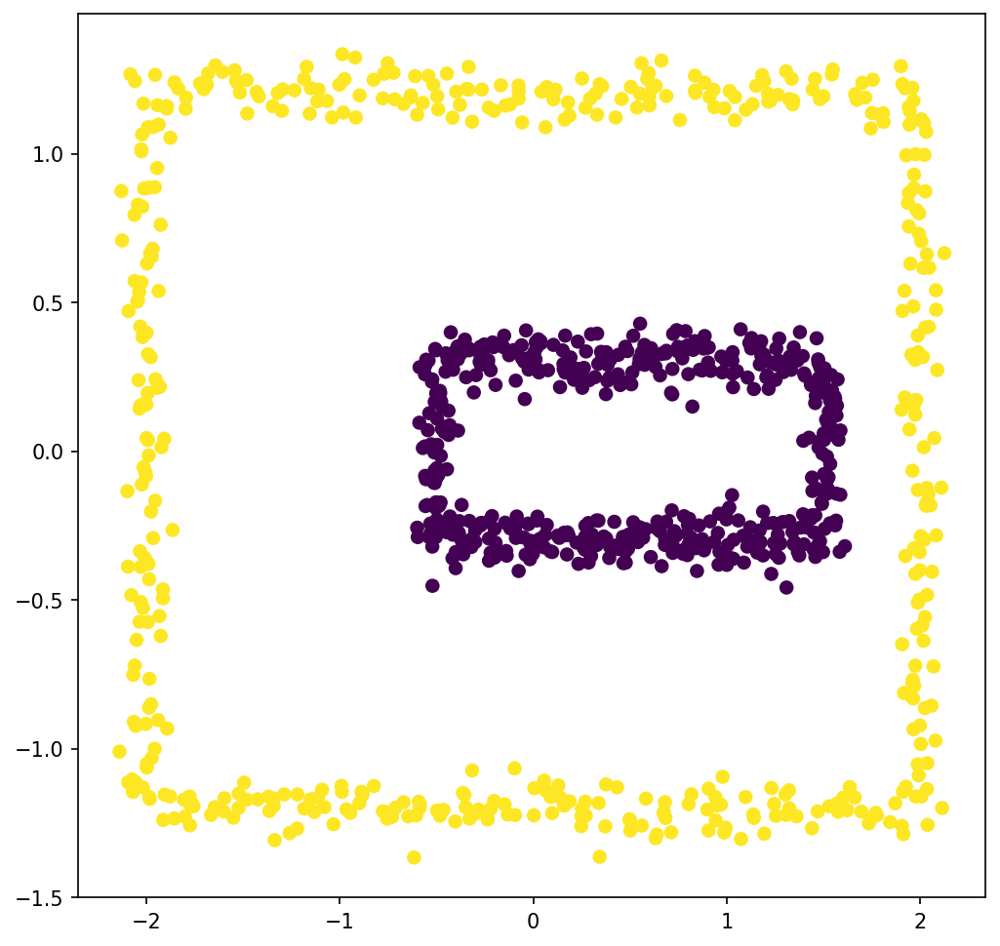

In [48]:
Image(path1 + '\\' + "square_2_main.png", width=500, height=500)

Widzimy, że dwuwymiarowy zbiór *square* oryginalnie jest podzielony na 2 klastry, co jest zgodne z wykresem punktowym.

In [49]:
wykres1(list(square['Adjusted Rand index']), list(square['Fowlkes-Mallows index']), list(square['Method']), plots_title)

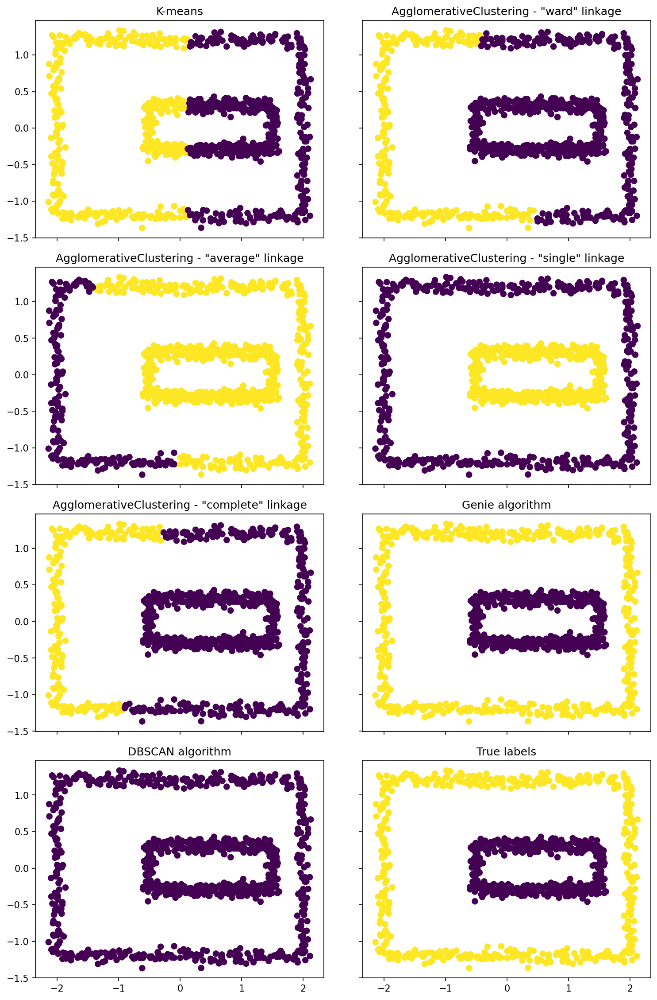

In [50]:
Image(path1 + '\\' + "square_2_builtin_methods.png", width=1000, height=500)

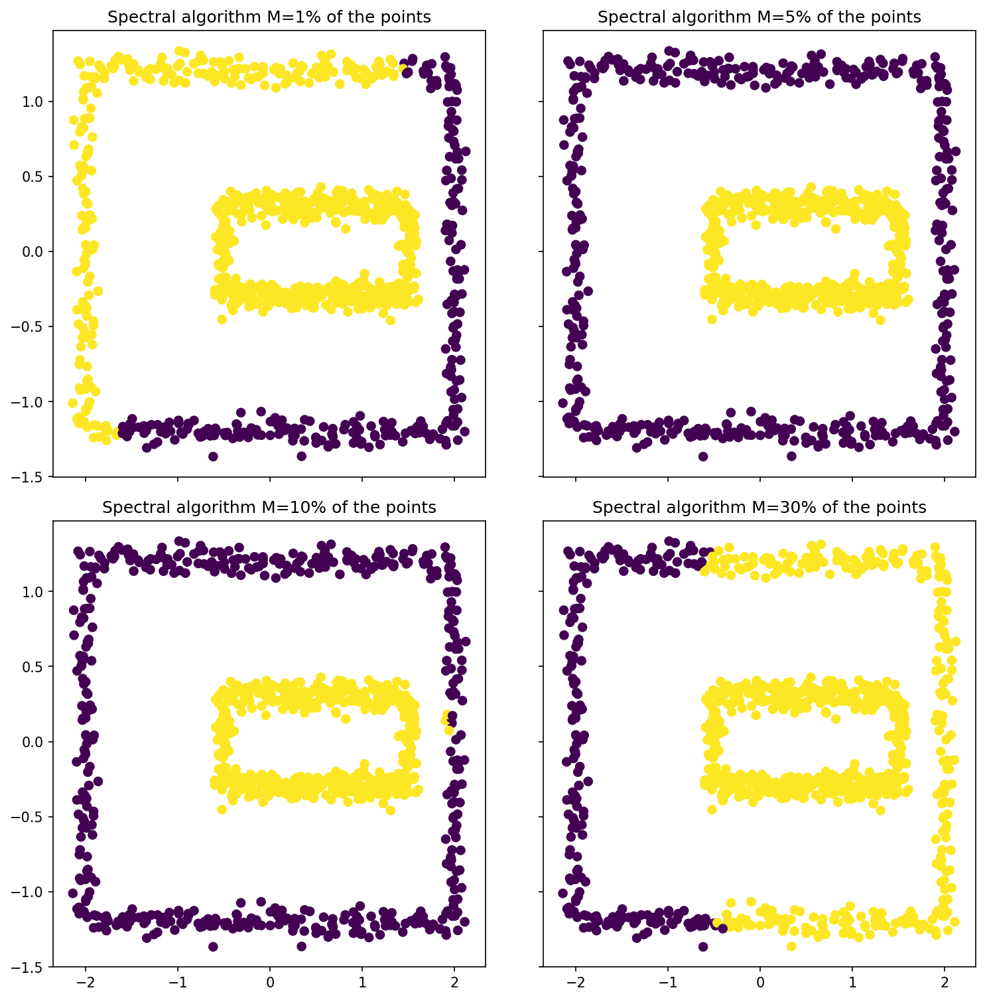

In [51]:
Image(path1 + '\\' + "square_2_spectral_algorithm.png", width=1000, height=500)

Dla tego zbioru już możemy znaleźć podziały równoważne z oryginalnym, w szczególności są to te wygenerowane dzięki metodom:
* Genie
* hierarchicznej z parametrem *single linkage*
* spektralnej z patametrem M=5% obserwacji oraz 10% obserwacji (wówczas współczynniki bardzo bliskie 1)

### Standaryzacja zmiennych

In [52]:
square_std = wczytaj(path1, 'square_std_2.csv')

Wymiary zbioru:  (1000, 2)
Liczba klastrów 2


In [53]:
wykres1(list(square['Adjusted Rand index']), list(square['Fowlkes-Mallows index']), list(square['Method']), plots_title)
wykres1(list(square_std['Adjusted Rand index']), list(square_std['Fowlkes-Mallows index']), list(square_std['Method']),
       plots_title + "<br> po standaryzacji zmiennych </br>")

Sytuacja jest podobna do tej z poprzedniego punktu. Z tego powodu, że przedziały wartości poszczególnych współrzędnych są symetryczne, a ich krańce są podobnej wielkości, standaryzacja niewiele zmienia w podziałach zbioru. Jedynie widoczna jest poprawa współczynników dla *metody spektralnej* z parametrem M=1% wszystkich obserwacji.

### Zbiór *isolation*

In [54]:
isolation = wczytaj(path1, 'isolation_3.csv')

Wymiary zbioru:  (9000, 2)
Liczba klastrów 3


Zbiór ma relatywnie dużo obserwacji, więc z powodu dużej złożoności obliczeniowej algorytmu spektralnego, nie zastosujemy go w tym podpunkcie (duża złożoność wynika z zaimplementowanego algorytmu przeszukiwania w głąb, która korzysta z rekurencji).

In [55]:
tabelka(names = list(isolation['Method']), index_ARI = list(isolation['Adjusted Rand index']), 
        index_FMI = list(isolation['Fowlkes-Mallows index']))

Widzimy, że podziały uzyskane za pomocą algorytmów *Genie* i *hierarchicznego* z parametrem *single linkage* są równoważne z oryginalnym podziałem. Zobaczmy to na wykresach:

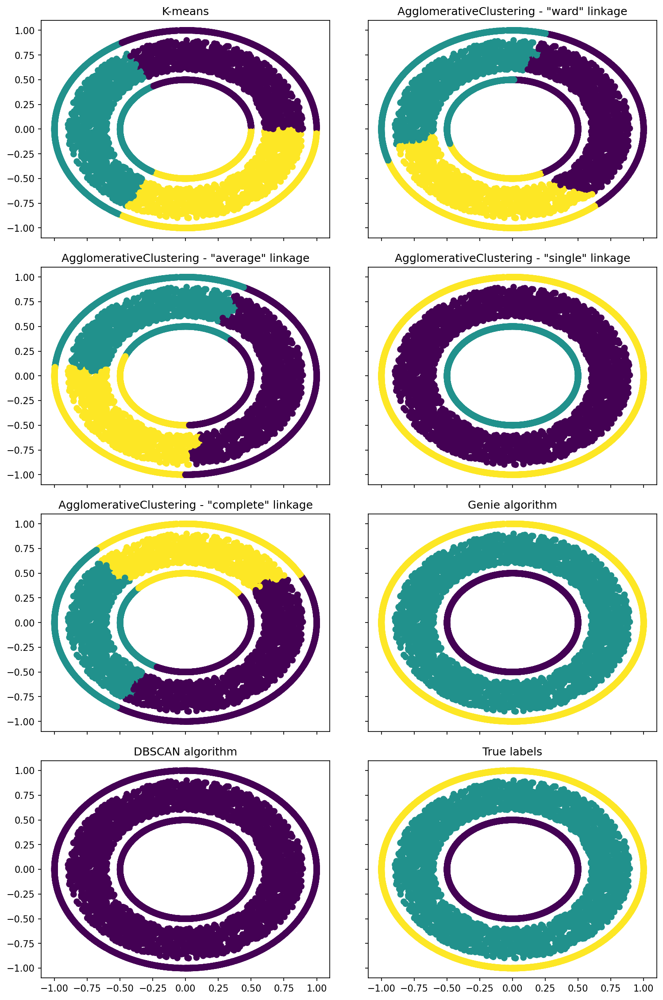

In [56]:
Image(path1 + '\\' + "isolation_3_builtin_methods.png", width=1000, height=500)

### Standaryzacja

W tym przypadku, biorąc pod uwagę poprzednie podpunkty, również standaryzacja niewiele zmieni wartości indeksów dla każdej z metod, ponieważ przedziały wartości współrzędnych są symetryczne i równej długości. Pokazują to dane poniższej tabeli.

In [57]:
isolation_std = wczytaj(path1, 'isolation_std_3.csv')

Wymiary zbioru:  (9000, 2)
Liczba klastrów 3


In [58]:
tabelka_std(list(isolation['Method']), list(isolation['Adjusted Rand index']), list(isolation['Fowlkes-Mallows index']),
            list(isolation_std['Adjusted Rand index']),list(isolation_std['Fowlkes-Mallows index']), w=1000, h=500)

## Zbiory danych w $\mathbb{R}^3$

### Zbiór *chainlink*

In [59]:
chainlink = wczytaj(path1, 'chainlink_2.csv')

Wymiary zbioru:  (1000, 3)
Liczba klastrów 2


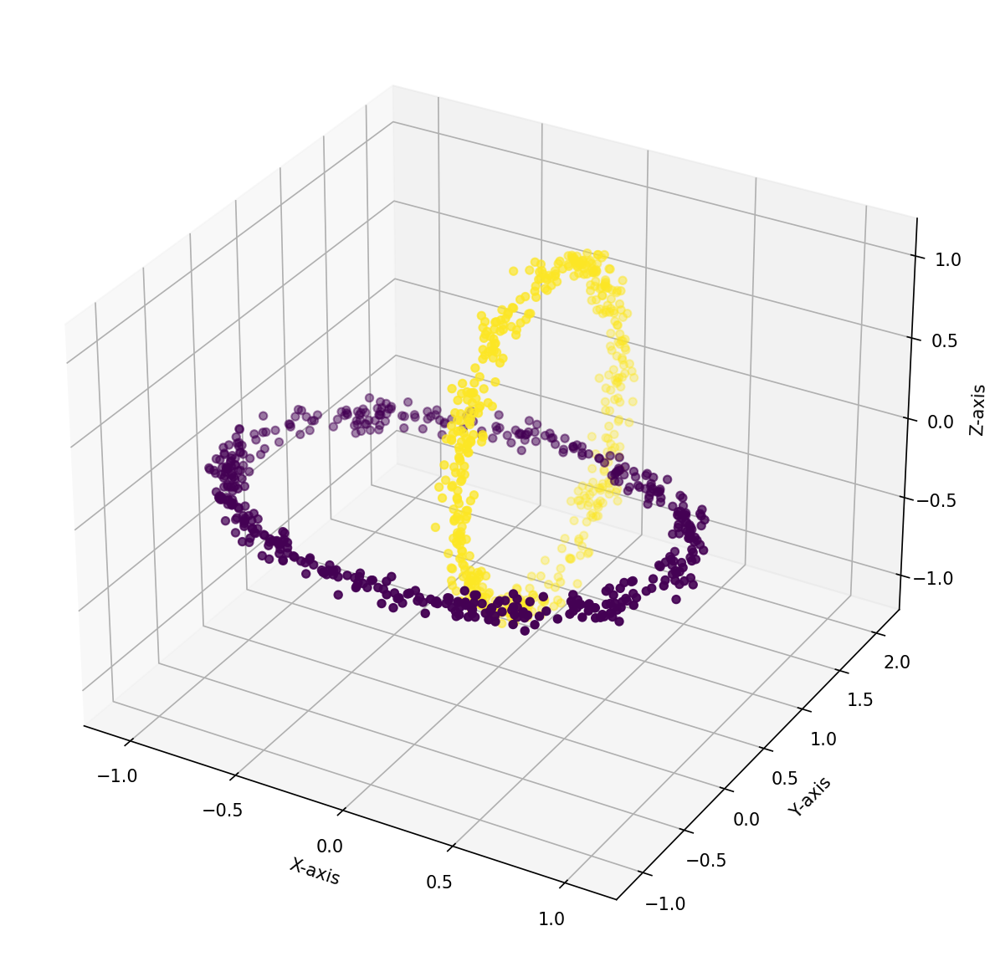

In [60]:
Image(path1 + '\\' + "chainlink_2_main.png", width=500, height=500)

Widzimy, że zbiór *chainlink* składa się z dwóch klastrów, których punkty na wykresie tworzą pierścienie, każdy z nich przechodzi przez wnętrze drugiego. Podobnie jak dla danych dwuwymiarowych, będziemy porównywać indeksy *FMI* oraz *ARI* dla poszczególnych metod oraz badać wpływ standaryzacji na ich wartości.

In [61]:
wykres1(list(chainlink['Adjusted Rand index']), list(chainlink['Fowlkes-Mallows index']), list(chainlink['Method']), plots_title)

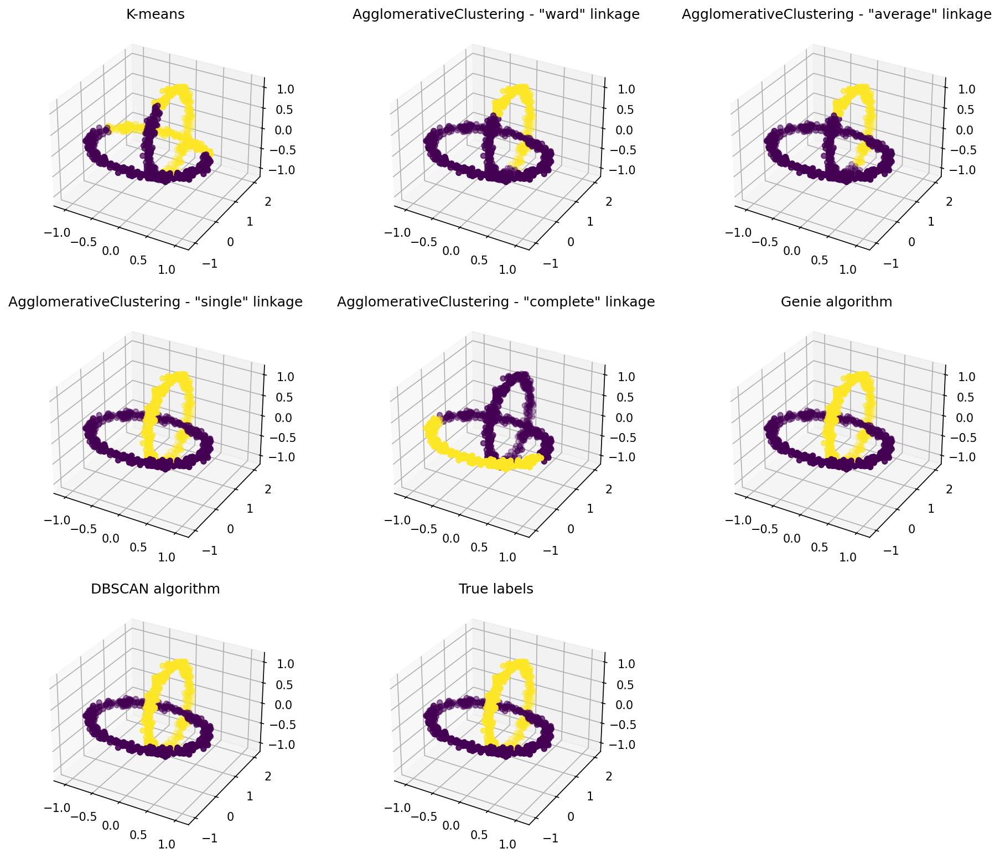

In [62]:
Image(path1 + '\\' + "chainlink_2_bulitin_methods.png", width=1000, height=500)

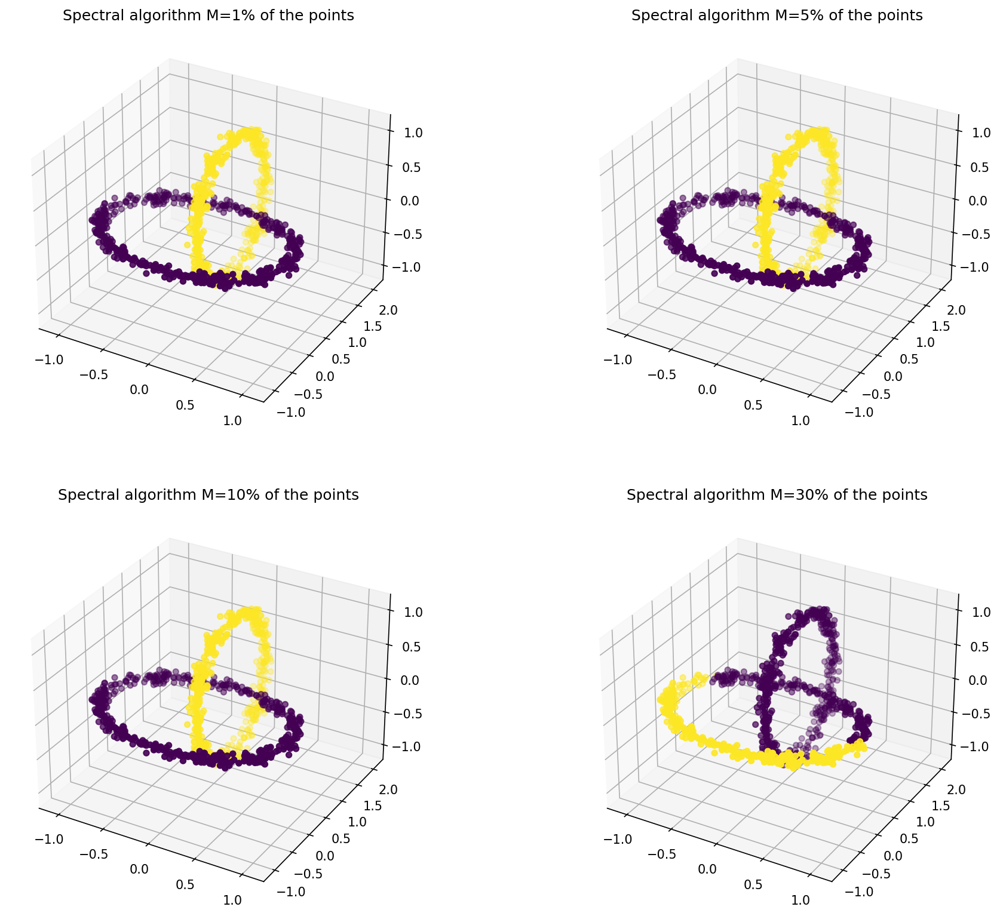

In [63]:
Image(path1 + '\\' + "chainlink_2_spectral_algorithm.png", width=1000, height=500)

Widzimy, że dla tego zbioru mamy kilka metod tworących podziały równoważne oryginalnemu. Są to:
* algorytm Genie
* metoda hierarchiczna z parametrem *single linkage*
* algorytm spektralny z patametrem M=1%, 5% oraz 10% obserwacji w zbiorze
* algorytm DBSCAN

### Standaryzacja zmiennych

W tym przypadku obserując zakresy wartości poszczególnych zmiennych, również można wysunąć hipotezę, że standaryzacja każdej z nich nie będzie miała większego wpływu na podział zbioru przez różne metody. Potwierdzają to dane w poniższej tabeli.

In [64]:
chainlink_std = wczytaj(path1, 'chainlink_std_2.csv')

Wymiary zbioru:  (1000, 3)
Liczba klastrów 2


In [65]:
tabelka_std(list(chainlink['Method']), list(chainlink['Adjusted Rand index']), list(chainlink['Fowlkes-Mallows index']),
            list(chainlink_std['Adjusted Rand index']),list(chainlink_std['Fowlkes-Mallows index']), w=1000, h=650)

### Zbiór *atom*

In [66]:
atom = wczytaj(path1, 'atom_2.csv')

Wymiary zbioru:  (800, 3)
Liczba klastrów 2


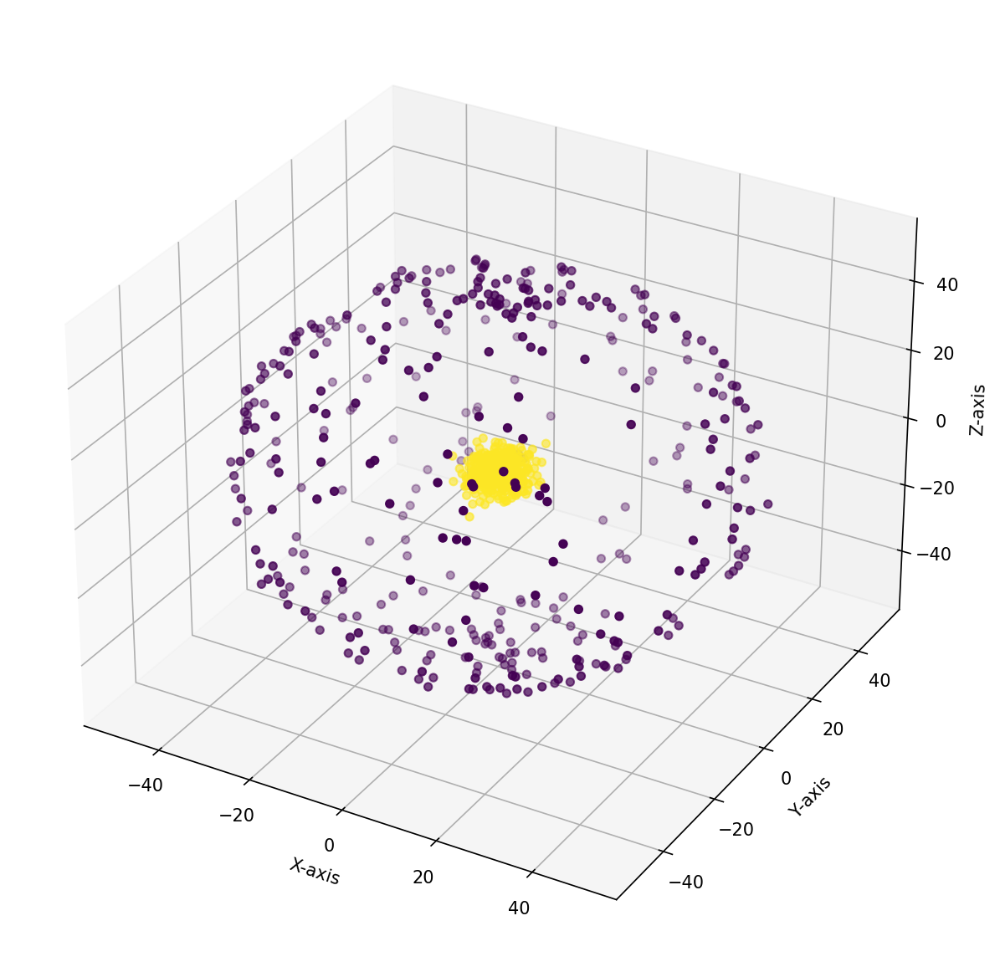

In [67]:
Image(path1 + '\\' + "atom_2_main.png", width=500, height=500)

Widzimy, że zbiór oryginalnie jest podzielony na dwa klastry, a punkty z każdego dnich tworzą kształ kul, z których jedna jest wewnątrz drugiej.

In [68]:
tabelka(names = list(atom['Method']), index_ARI = list(atom['Adjusted Rand index']), 
        index_FMI = list(atom['Fowlkes-Mallows index']), w=1050, h=500)

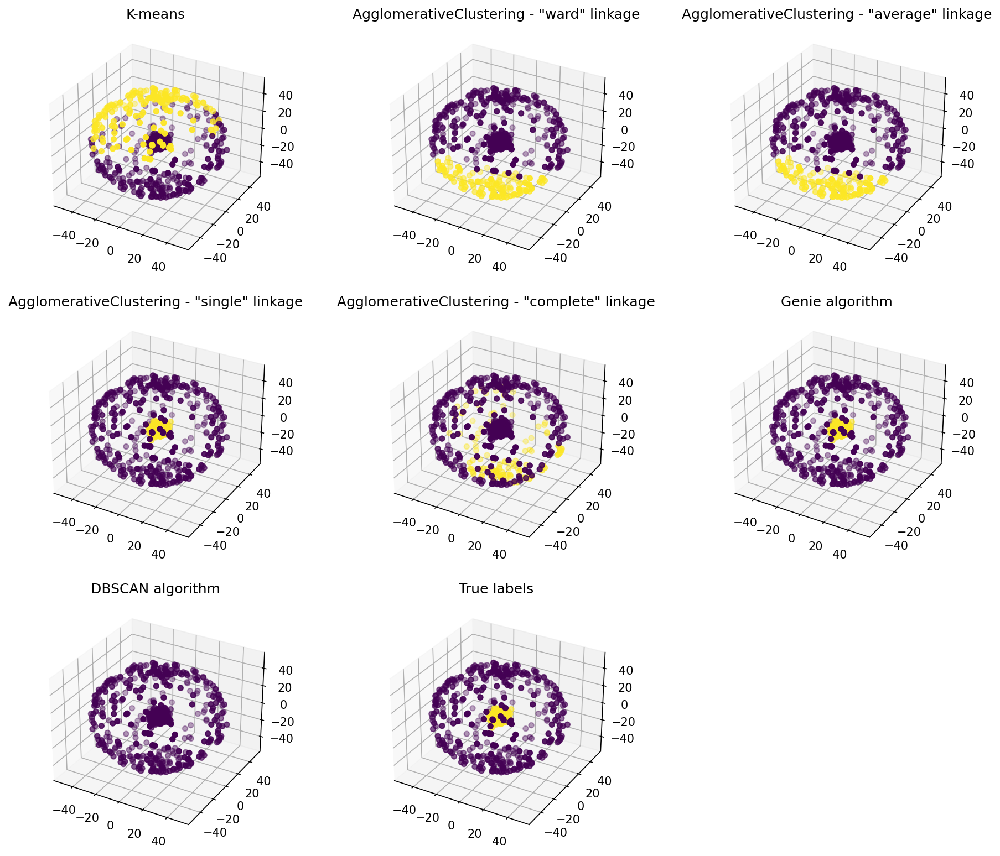

In [69]:
Image(path1 + '\\' + "atom_3_bulitin_methods.png", width=1000, height=500)

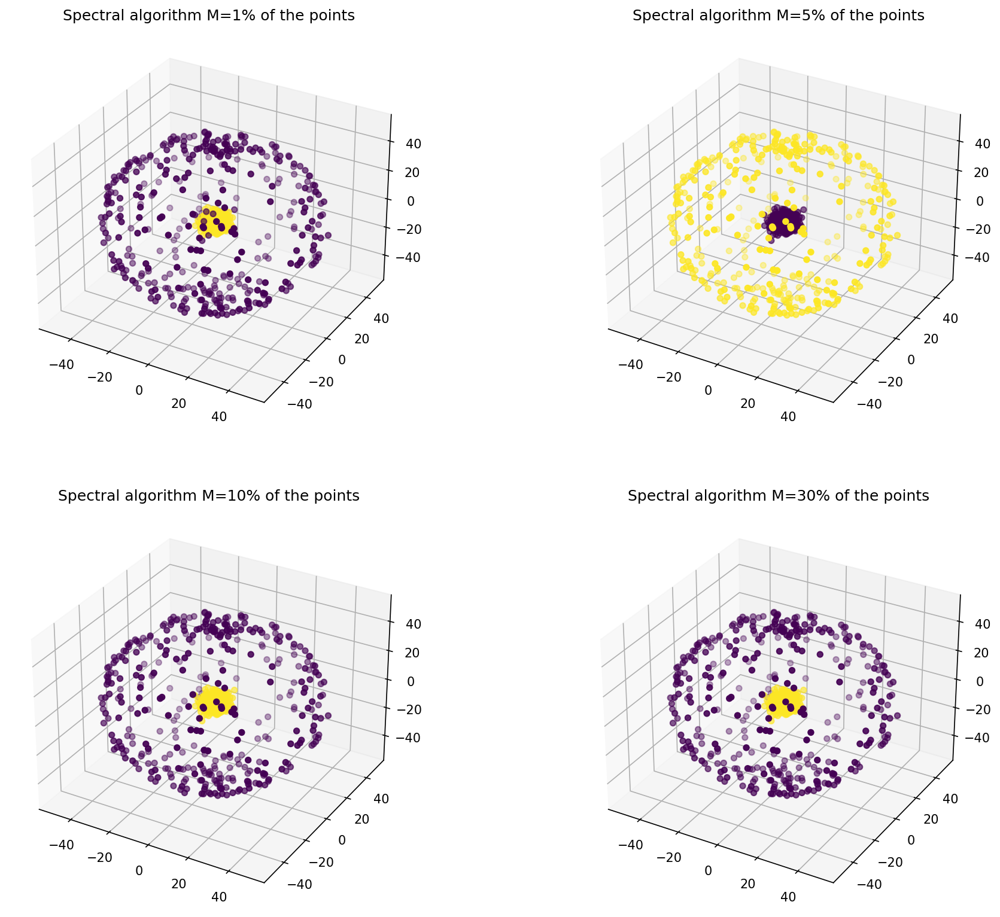

In [70]:
Image(path1 + '\\' + "atom_3_spectral_algorithm.png", width=1000, height=500)

Możemy zauważyć na podstawie powyższej tabeli oraz wykresów, że zdecydowanie najlepsze podziały zbioru generują metody: 
* spektralna dla każdego zdefiniowanego paramteru M
* hierarchiczna z parametrem *single linkage*
* Genie

### Standaryzacja zmiennych

In [71]:
atom_std = wczytaj(path1, 'atom_std_2.csv')

Wymiary zbioru:  (800, 3)
Liczba klastrów 2


Porównajmy wartości indeksów przed i po standaryzacji

In [72]:
wykres1(list(atom['Adjusted Rand index']), list(atom['Fowlkes-Mallows index']), list(atom['Method']), plots_title)
wykres1(list(atom_std['Adjusted Rand index']), list(atom_std['Fowlkes-Mallows index']), list(atom_std['Method']),
       plots_title + "<br> po standaryzacji zmiennych </br>")

Widzimy, że dzięki standaryzacji zdecydowanie poprawiła się jakość podziału generowanego przez metodę *DBSCAN*. Pozostałe wartości indeksów niewiele się zmieniły.

## Zbiór wielowymiarowy

In [73]:
sonar = wczytaj(path1, 'sonar_2.csv')

Wymiary zbioru:  (208, 60)
Liczba klastrów 2


In [74]:
sonar_std = wczytaj(path1, 'sonar_std_2.csv')

Wymiary zbioru:  (208, 60)
Liczba klastrów 2


Widzimy, że zbiór *sonar* ma 60 zmiennych i jest podzielony na 2 klastry. Porównamy wartości indeksów *ARI* oraz *FMI* dla poszczególnych metod. Z oczywistych powodów wizualizacja podziału jest niewykonalna.

In [75]:
tabelka_std(list(sonar['Method']), list(sonar['Adjusted Rand index']), list(sonar['Fowlkes-Mallows index']),
            list(sonar_std['Adjusted Rand index']),list(sonar_std['Fowlkes-Mallows index']), w=1000, h=650)

Widzimy, że dla powyżej zdefiniowanego zbioru, wszystkie metody zwracają podział, który nie jest zbliżony do oryginalnego, co obrazują bliskie zera wartości indeksu *ARI*

## Wnioski

Na podstawie 10 pobranych zbiorów benchmarkowych i wygenerowanych z nich wyników w postaci plików *.csv* oraz *.png* możemy wysunąć następujące wnioski:
* Dla zbiorów których punkty tworzą nieregularne, rozdzielone kształty najlepiej działają metody:
    - *Genie* 
    - *spektralna* z parametrem M o niedużej wartości (w większości przypadków między 10 a 20)
    - *hierarchiczna* bazująca na minimalnej odległości między punktami z różnych klastrów.
* Dla zbiorów miejscami zagęszczonych dobrze działa algorytm *DBSCAN*.
* Dla zbiorów, których punkty nie są jednoznacznie rozdzielone dobrze działają metody oparte na średnich (*k-średnich* czy *hierarchiczna* z parametrem *average linkage*).
* Dla zmiennych o wartościach z przedziałów symetrycznych, których krańce są wielkościami tego samego rzędu, standaryzacja nie poprawia współczynników *FMI* oraz *ARI* znacząco.
* Współczynniki *FMI* o wartościach większych od 0.6 nie grawantują dobrego podziału zbioru (bardziej wiarygodne są wyższe wartości indeksu *ARI*, aczkolwiek i one mogą wprowadzać w błąd)
* Najbardziej uniwersalnym algorytmem działającym efektywnie w większości przypadków jest algorytm *Genie* oraz metoda spektralna z odpowiednio dobranym parametrem M

Dodatkowo zaletą metody DBSCAN jest brak konieczności odgórnie zdefiniowanej ilości klastrów, co może pomóc kiedy nie jesteśmy w stanie zwizualizować danych lub nie potrafimy jednoznacznie stwierdzić liczby klastrów.